# In search of novel base-pairing in E. coli upstream regions

## Loading RINALMo

In [1]:
import os
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# set current dir to the rinalmo path
project_path = 'DNALM_dependencies'
os.chdir(os.path.join(project_path, 'RiNALMo'))

In [2]:
data_path = 'data'

In [2]:
import torch
from rinalmo.pretrained import get_pretrained_model

device = "cuda:0"


In [ ]:

model, alphabet = get_pretrained_model(model_name="giga-v1")
model = model.to(device=device)
model.eval()
seqs = ["ACUUUGGCCA", "CCCGGU", "ACGU"]

tokens = torch.tensor(alphabet.batch_tokenize(seqs), dtype=torch.int64, device=device)

In [ ]:
nuc_table = {"A" : 0, "C":1, "G":2, "U":3} # For RINALMo we have Us instead of Ts

def mutate_sequence(seq):
    seq = seq.upper()
    mutated_sequences = {'seq':[], 'mutation_pos':[], 'nuc':[], 'var_nt_idx':[]} #,'gene_id': []}
    #mutated_sequences['gene_id'].append(gene_id)
    mutated_sequences['seq'].append(seq)
    mutated_sequences['mutation_pos'].append(-1)
    mutated_sequences['nuc'].append('real sequence')
    mutated_sequences['var_nt_idx'].append(-1)


    mutate_until_position = len(seq)

    for i in range(mutate_until_position):
        for nuc in ['A', 'C', 'G', 'U']:
            if nuc != seq[i]:
                #mutated_sequences['gene_id'].append(gene_id)
                mutated_sequences['seq'].append(seq[:i] + nuc + seq[i+1:])
                mutated_sequences['mutation_pos'].append(i)
                mutated_sequences['nuc'].append(nuc)
                mutated_sequences['var_nt_idx'].append(nuc_table[nuc])

    mutations_df = pd.DataFrame(mutated_sequences)

    return mutations_df

In [ ]:
import torch
from torch.utils.data import Dataset, DataLoader

class RNADataset(Dataset):
    def __init__(self, sequences):
        self.sequences = sequences

    def __len__(self):
        return len(self.sequences)

    def __getitem__(self, idx):
        return self.sequences[idx]

def custom_collate_fn(batch):

    # batch is a list of sequences
    tokenized_batch = torch.tensor(alphabet.batch_tokenize(batch), 
                                   dtype=torch.int64, 
                                   device=device)
    return tokenized_batch

batch_size = 64

def create_dataloader(dataset, batch_size=batch_size):
    rna_dataset = RNADataset(list(dataset['seq'].values))
    data_loader = DataLoader(rna_dataset, 
                            batch_size=batch_size, 
                            shuffle=False,
                            collate_fn=custom_collate_fn)
    return data_loader

In [ ]:
acgu_idxs = [5, 6, 7, 8]
def model_inference(model, data_loader):

    print(f'Inferencing {len(data_loader)} batches')
    output_arrays = []
    for i, batch_tokens in enumerate(data_loader):
        # get some tokenized sequences (B, L_in)
        
        with torch.no_grad(), torch.cuda.amp.autocast():
            outputs = model(batch_tokens)['logits'].cpu().to(torch.float32)
        output_probs = torch.nn.functional.softmax(outputs, dim=-1)[:,:,acgu_idxs] # B, L_seq, 4
        output_arrays.append(output_probs) 

    print(f'Inferencing done')

    # rebuild to nseqs, L_seq, 4
    snp_reconstruct = torch.concat(output_arrays, axis=0)

    return snp_reconstruct.to(torch.float32).numpy()

In [ ]:
def compute_ci_matrix(gene_seq,  get_logit=True, effect_on_ref_only = False):

    dataset = mutate_sequence(gene_seq) 
    data_loader = create_dataloader(dataset)
    snp_reconstruct = model_inference(model, data_loader)
    snp_reconstruct = snp_reconstruct[:,1:-1,:] # discard the beginning of sentence token and end of sentence token
    print(snp_reconstruct.shape)

    non_zero_log_value = 1e-10 #due to the conversion to bfloat16, we need to add a small value to avoid log(0)

    if get_logit: # for the logit add the small value and renormalize such that every prob in one position sums to 1
        snp_reconstruct = snp_reconstruct + non_zero_log_value
        snp_reconstruct = snp_reconstruct/snp_reconstruct.sum(axis=-1)[:,:, np.newaxis]

    seq_len = snp_reconstruct.shape[1]
    snp_effect = np.zeros((seq_len, seq_len,4, 4))
    reference_probs = snp_reconstruct[dataset[dataset['nuc'] == 'real sequence'].index[0]]

    print('shape of the reference probs:', reference_probs.shape)

    if get_logit:
        snp_effect[dataset.iloc[1:]['mutation_pos'].values, : ,  dataset.iloc[1:]['var_nt_idx'].values,:] = np.log2(snp_reconstruct[1:]) - np.log2(1 - snp_reconstruct[1:]) \
            - np.log2(reference_probs) + np.log2(1-reference_probs)
    else:
        snp_effect[dataset.iloc[1:]['mutation_pos'].values, : ,  dataset.iloc[1:]['var_nt_idx'].values,:] = np.log2(snp_reconstruct[1:]+non_zero_log_value) - np.log2(reference_probs+non_zero_log_value)

    if effect_on_ref_only:
        gene_seq_int = dataset.iloc[1:].groupby('mutation_pos').apply(lambda pos_df: (set(range(4)) - set(pos_df['var_nt_idx'])).pop()).values
        snp_effect_on_ref = snp_effect[:,np.arange(seq_len),:, gene_seq_int]
        ci_matrix = np.max(np.abs(snp_effect_on_ref), axis=2)

    else:
        ci_matrix = np.max(np.abs(snp_effect), axis=(2,3))

    return ci_matrix

def plot_ci_matrix(ci_matrix, vmax=None, figsize=[10, 10]):#increase figure size
    plt.rcParams['figure.figsize'] = figsize
    plt.imshow(ci_matrix, cmap="coolwarm", vmax=vmax) if vmax is not None else plt.imshow(ci_matrix, cmap="coolwarm")
    return plt

In [ ]:
import pandas as pd
import numpy as np
import torch
import matplotlib.pyplot as plt
import seaborn as sns
import os
from scipy.signal import convolve2d
import math
import argparse
from collections import OrderedDict
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import time
import random



def get_ci_matrix(filename):

    return np.load(filename)


print(f'GPU Model: {torch.cuda.get_device_name(0)}')


In [4]:
bps='500'
root_folder = f'UTRs_Ecoli_{bps}bp'

In [ ]:
all_files = os.listdir(root_folder)
all_utr_chunks = [file.replace(f'_{bps}bpUTR', '').split('.npy')[0] for file in all_files if '.npy' in file]
all_files = [os.path.join(root_folder, file) for file in  all_files if '.npy' in file]
all_files, all_utr_chunks

In [ ]:
import torch.nn.functional as F


class GeneMatrix(Dataset):
    def __init__(self, all_files, all_utr_chunks=all_utr_chunks): #padding_size=padding_size,

        self.filenames = all_files
        #self.padding_size = padding_size
        self.utr_chunks = all_utr_chunks

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        file = self.filenames[idx]
        #snp_matrix = np.load(file)
        #ci_matrix = torch.tensor(np.max(np.abs(snp_matrix), axis=(2,3)), dtype=torch.float32).unsqueeze(0) #add a dimension for the channel
        ci_matrix = torch.tensor(get_ci_matrix(file), dtype=torch.float32).unsqueeze(0)
       
        #pad ci_matrix of shape (N_i, N_i) to (1, self.padding_size, self.padding_size):
        #ci_matrix = F.pad(ci_matrix, (0, self.padding_size-ci_matrix.shape[1], 0, self.padding_size-ci_matrix.shape[2]), "constant", 0)

        return ci_matrix

dataset = GeneMatrix(all_files)
batch_size=128
data_loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)

In [ ]:
mat = np.load(all_files[0])
seqs_len = mat.shape[0]

In [14]:
seqs_len

503

In [15]:
def create_diagonal_filter(diagonal_width, filter_size, remove_mean=True, antidiagonal=False, negative_filter_value=-1, positive_filter_value=1):

    convolutional_filter = negative_filter_value * np.ones((filter_size, filter_size))

    # set the main antidiagonal and its adjacent diagonals to positive_filter_value
    for offset in range(-math.floor(diagonal_width/2), math.ceil(diagonal_width/2)):
        # adjust the range based on the offset to avoid going out of bounds
        if offset < 0:
            rng = np.arange(-offset, filter_size)
        else:
            rng = np.arange(filter_size - offset)
        
        convolutional_filter[rng, rng+offset] = positive_filter_value

    convolutional_filter = convolutional_filter[:,::-1] if antidiagonal else convolutional_filter # flip the filter with respect to the vertical axis to get an antidiagonal
    if remove_mean:
        convolutional_filter = convolutional_filter - convolutional_filter.mean()

    return convolutional_filter

#create a conv mask that masks the diagonal and the adjacent diagonals
def create_conv_diag_mask(mask_width = 9, filter_size = 5, seq_region_length = seqs_len):

    conv_mask = torch.zeros((seq_region_length - filter_size + 1, seq_region_length - filter_size + 1))

    for k in range(-mask_width // 2 + 1, mask_width // 2 + 1):
        conv_mask += torch.diag(torch.ones(seq_region_length - filter_size + 1 - abs(k)), diagonal=k)

    conv_mask = 1 - conv_mask
    conv_mask =conv_mask.to("cuda")
    return conv_mask

print('Creating filters and masks...')
# anti diagonal filter
filter_size = 5
anti_diag_filter = create_diagonal_filter(diagonal_width = 1, filter_size=filter_size, antidiagonal=True, negative_filter_value=-1)
anti_diag_filter = torch.tensor(anti_diag_filter.copy(), dtype=torch.float32).unsqueeze(0).unsqueeze(0).to("cuda")
conv_anti_diag_mask = create_conv_diag_mask(mask_width = 9, filter_size = 5, seq_region_length = seqs_len)

# diagonal filter
filter_size = 5
diag_filter = create_diagonal_filter(diagonal_width = 1, filter_size=filter_size, antidiagonal=False)
diag_filter = torch.tensor(diag_filter.copy(), dtype=torch.float32).unsqueeze(0).unsqueeze(0).to("cuda")
conv_diag_mask = create_conv_diag_mask(mask_width = 9, filter_size = 5, seq_region_length = seqs_len)

# Filter that averages the col values for each row. This is used to find the row with the highest average value so we can find hotpsots
hotspot_size = 1
hotspot_row_filter = torch.tensor((1/seqs_len) * np.ones((1, 1, hotspot_size, seqs_len)), dtype=torch.float32).to("cuda") 
conv_mask_hotspot_row = create_conv_diag_mask(mask_width = 9, filter_size = 1, seq_region_length = seqs_len)

# Hotspot col
hotspot_size = 1
hotspot_col_filter = torch.tensor((1/seqs_len) * np.ones((1, 1, seqs_len, hotspot_size)), dtype=torch.float32).to("cuda") 
conv_mask_hotspot_col = create_conv_diag_mask(mask_width = 9, filter_size = 1, seq_region_length = seqs_len)

Creating filters and masks...


In [16]:
import pyranges as pr

gtf_file = os.path.join(data_path, 'GCF_000005845.2_ASM584v2_genomic.gtf')
fasta_file = os.path.join(data_path, 'GCF_000005845.2_ASM584v2_genomic.fna')

gtf_df = pr.read_gtf(gtf_file, full=False).df
gtf_df

,Chromosome,Start,End,Strand,Feature,gene_id,transcript_id,exon_number,exon_id
0,NC_000913.3,189,255,+,gene,b0001,; db_xref ASAP:ABE-0000006,NaN,NaN
1,NC_000913.3,189,252,+,CDS,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN
2,NC_000913.3,189,192,+,start_codon,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN
3,NC_000913.3,252,255,+,stop_codon,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN
4,NC_000913.3,336,2799,+,gene,b0002,; db_xref ASAP:ABE-0000008,NaN,NaN
...,...,...,...,...,...,...,...,...,...
18015,NC_000913.3,4634440,4634443,-,stop_codon,b4396,gnl|b4396|mrna.NP_418813,1.0,NaN
18016,NC_000913.3,4639589,4640306,-,gene,b4401,; db_xref ASAP:ABE-0014434,NaN,NaN
18017,NC_000913.3,4639592,4640306,-,CDS,b4401,gnl|b4401|mrna.NP_418818,1.0,NaN
18018,NC_000913.3,4640303,4640306,-,start_codon,b4401,gnl|b4401|mrna.NP_418818,1.0,NaN


In [17]:
#fetch 100bp before each start codon
n_bp = seqs_len-3
gtf_start_df = gtf_df[gtf_df['Feature'] == 'start_codon'].copy()
gtf_start_df['Start'] = gtf_df.apply(lambda x: x['Start'] - n_bp if x['Strand'] == '+' else x['Start'], axis=1)
gtf_start_df['End'] = gtf_df.apply(lambda x: x['End'] + n_bp if x['Strand'] == '-' else x['End'], axis=1)
gtf_start_pr = pr.PyRanges(gtf_start_df)
gtf_start_pr.seq = pr.get_sequence(gtf_start_pr, fasta_file)
gtf_start_df = gtf_start_pr.df
gtf_start_df

,Chromosome,Start,End,Strand,Feature,gene_id,transcript_id,exon_number,exon_id,seq
0,NC_000913.3,-311,192,+,start_codon,b0001,gnl|b0001|mrna.NP_414542,1.0,NaN,
1,NC_000913.3,-164,339,+,start_codon,b0002,gnl|b0002|mrna.NP_414543,1.0,NaN,
2,NC_000913.3,2300,2803,+,start_codon,b0003,gnl|b0003|mrna.NP_414544,1.0,NaN,GGCGACCACGCTGGCGCGGGAAATGGGTTATACCGAACCGGACCCG...
3,NC_000913.3,3233,3736,+,start_codon,b0004,gnl|b0004|mrna.NP_414545,1.0,NaN,CGTGTTTTCTCGGTGGTATGCAGTTGATGATCGAAGAAAACGACAT...
4,NC_000913.3,4733,5236,+,start_codon,b0005,gnl|b0005|mrna.NP_414546,1.0,NaN,AAACCACGCAACAGACAATGCGTGAGTTAAAAGAACTGGGCTACAC...
...,...,...,...,...,...,...,...,...,...,...
4310,NC_000913.3,4624786,4625289,-,start_codon,b4387,gnl|b4387|mrna.NP_418804,1.0,NaN,TTGGCAATTTCATCAATACATTCAATCTGGATGGCGGTGGAGTCCA...
4311,NC_000913.3,4630519,4631022,-,start_codon,b4391,gnl|b4391|mrna.NP_418808,1.0,NaN,GGAGGAAGCGTGGGGTTAGCGCGAACAAAGTTAGTGACCGTCACCG...
4312,NC_000913.3,4633742,4634245,-,start_codon,b4394,gnl|b4394|mrna.NP_418811,1.0,NaN,TGACTCACCAGCAGCGGTCGGCTTCCCTGCGGTAAGTCCCGGCAAG...
4313,NC_000913.3,4635307,4635810,-,start_codon,b4396,gnl|b4396|mrna.NP_418813,1.0,NaN,CCGTTTTTAATACGATCCGACAGTTCAATCGGCCCGACTTGCTGAC...


In [18]:
import seaborn as sns
#plot_size = 50
#na_seq = RNA
tick_label_fontsize = 4

def plot_w_seq(ci_matrix, dna_seq, plot_size = 10, tick_label_fontsize = 4, filename=None, savefig=False, dpi=300, vmax=5):
    print(f"Sequence length: {len(dna_seq)}")
    plt.figure(figsize=(plot_size, plot_size))
    sns.heatmap(ci_matrix, cmap='coolwarm', vmax=vmax,  cbar=False)

    plt.gca().set_aspect('equal')

    tick_positions = np.arange(len(dna_seq)) + 0.5
    plt.xticks(tick_positions, list(dna_seq), fontsize=tick_label_fontsize, rotation=0)
    plt.yticks(tick_positions, list(dna_seq), fontsize=tick_label_fontsize, rotation=0)

    if savefig:
        plt.savefig(filename, dpi=dpi, bbox_inches='tight')

    plt.show()

One example:

<module 'matplotlib.pyplot' from '/opt/modules/i12g/anaconda/envs/flash2/lib/python3.8/site-packages/matplotlib/pyplot.py'>

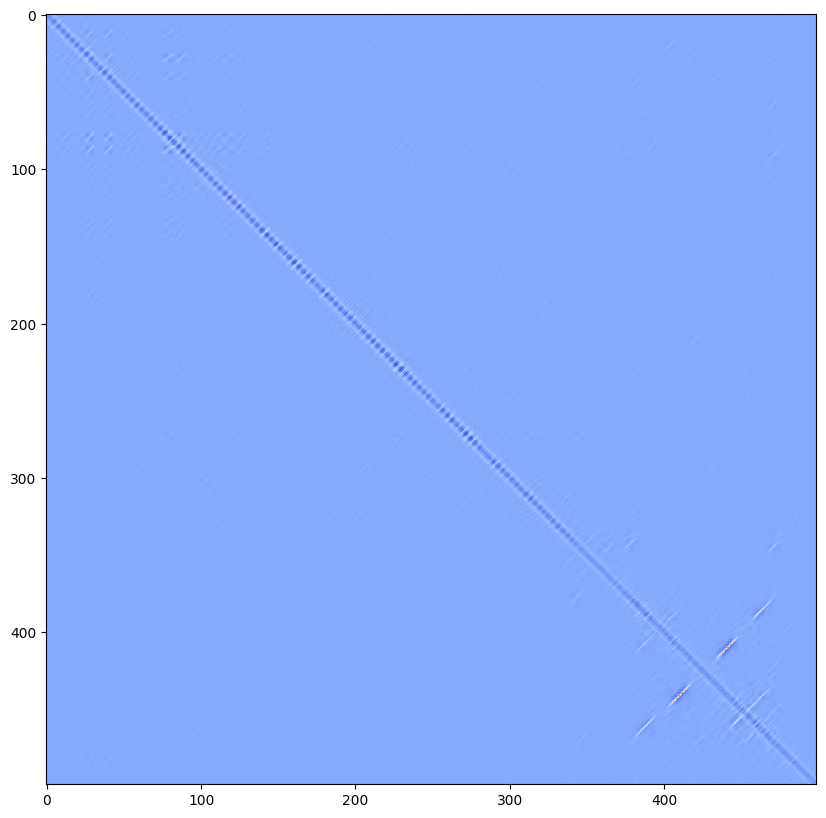

In [19]:
#load as float32 and to cuda
batch = torch.tensor(np.load(f'UTRs_Ecoli_{bps}bp/b0028_{bps}bpUTR.npy')).unsqueeze(0).to('cuda').to(torch.float32)
batch.shape
conv_filter = anti_diag_filter
conv_mask = conv_anti_diag_mask
output = F.conv2d(batch, conv_filter)
output = output.squeeze(1)
plot_ci_matrix(output.cpu().numpy().squeeze())

<module 'matplotlib.pyplot' from '/opt/modules/i12g/anaconda/envs/flash2/lib/python3.8/site-packages/matplotlib/pyplot.py'>

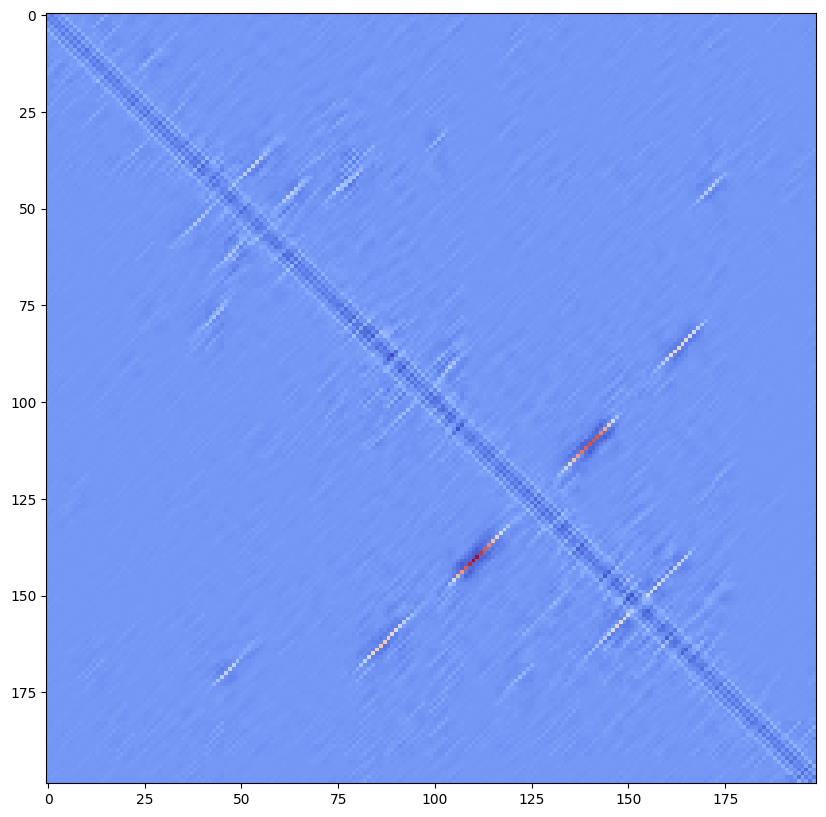

In [ ]:
#load as float32 and to cuda
batch = torch.tensor(np.load(f'UTRs_Ecoli_{bps}bp/b0028_{bps}bpUTR.npy')).unsqueeze(0).to('cuda').to(torch.float32)
batch.shape
conv_filter = anti_diag_filter
conv_mask = conv_anti_diag_mask
output = F.conv2d(batch, conv_filter)
output = output.squeeze(1)
plot_ci_matrix(output.cpu().numpy().squeeze())

<module 'matplotlib.pyplot' from '/opt/modules/i12g/anaconda/envs/flash2/lib/python3.8/site-packages/matplotlib/pyplot.py'>

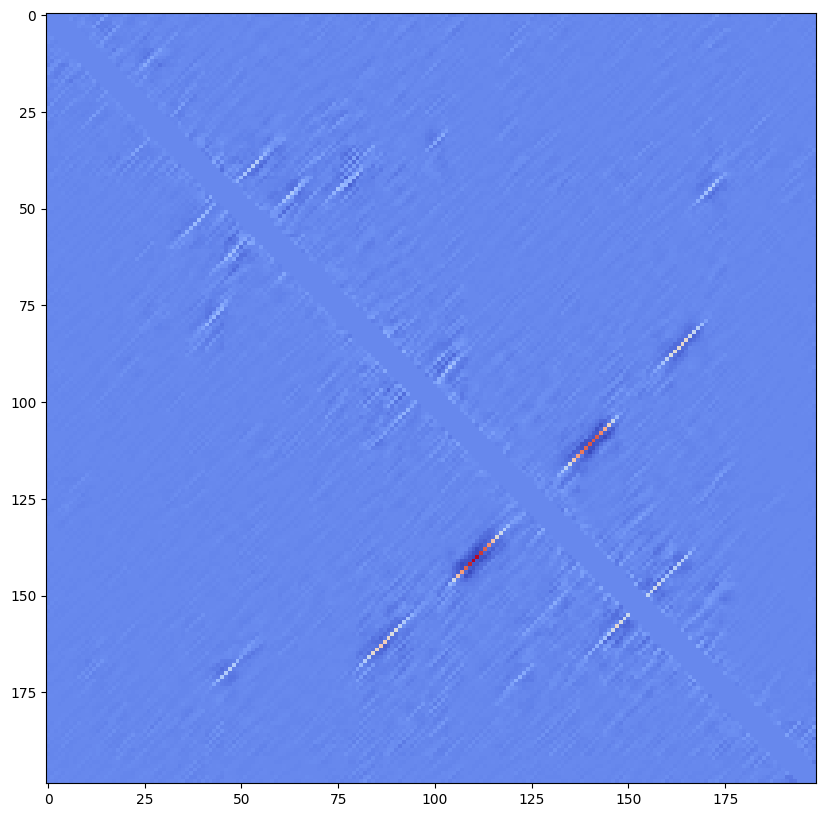

In [22]:
output = output * conv_mask
plot_ci_matrix(output.cpu().numpy().squeeze())

<module 'matplotlib.pyplot' from '/opt/modules/i12g/anaconda/envs/flash2/lib/python3.8/site-packages/matplotlib/pyplot.py'>

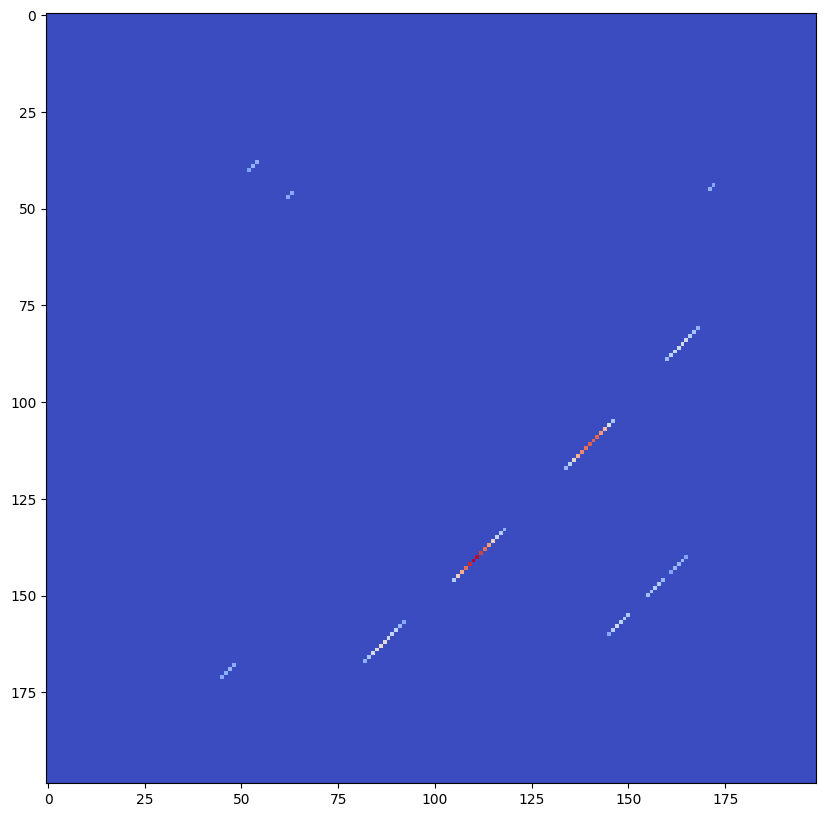

In [ ]:
threshold=15
output[output < threshold] = 0
plot_ci_matrix(output.cpu().numpy().squeeze())

In [20]:
from torchvision.ops import nms



def apply_conv_get_max(batch, conv_filter, conv_mask, apply_mask_first = False):

    if apply_mask_first:
        output = batch * conv_mask #mask the diagonal and adjacent diagonals

    output = F.conv2d(batch, conv_filter)

    # get the argmax of the output for different images of the vetor output of shape (n_images, 1, seq_len, seq_len)
    #pytorch doesn't have an implemmentation of an argmax across multiple dims so we need to do it in two steps
    output = output.squeeze(1)

    #torch.amax(output, (1,2), keepdim=True)

    if not apply_mask_first:
        output = output * conv_mask #mask the diagonal and adjacent diagonals

    max_conv_values = torch.amax(output, (1,2), keepdim=True)
    argmax = torch.nonzero(torch.Tensor(output == max_conv_values)).cpu()
    #this returns a vector with the indices of the max values for each image

    # Randomly select one index for each image if there are multiple max values
    selected_indices = []
    for i in range(batch.shape[0]):
        # Filter indices for each image
        indices_per_matrix = argmax[argmax[:, 0] == i]

        # Randomly select one index or use a default value
        if len(indices_per_matrix) > 1:
            random_index = random.choice(indices_per_matrix)
            selected_indices.append(random_index.unsqueeze(0))
        else:
            selected_indices.append(indices_per_matrix)

    argmax = torch.cat(selected_indices,axis=0)

    assert argmax.shape[0] == batch.shape[0] #check that we have an argmax for each image in the batch
    argmax = argmax[:,1:] #discard the first column, which corresponds to the image index

    return max_conv_values.squeeze().cpu(), argmax

K=50
def apply_conv_get_average_top_K(batch, conv_filter, conv_mask, K=K, apply_mask_first = False):
    
    if apply_mask_first:
        output = batch * conv_mask #mask the diagonal and adjacent diagonals

    output = F.conv2d(batch, conv_filter)

    # get the argmax of the output for different images of the vetor output of shape (n_images, 1, seq_len, seq_len)
    #pytorch doesn't have an implemplementation of an argmax across multiple dims so we need to do it in two steps
    output = output.squeeze(1)

    #torch.amax(output, (1,2), keepdim=True)

    if not apply_mask_first:
        output = output * conv_mask #mask the diagonal and adjacent diagonals

    # Flatten the output and get the top K values for each image
    batch_size = output.shape[0]
    output_flat = output.view(batch_size, -1)
    
    # Get the top K values
    top_k_values, _ = torch.topk(output_flat, K, dim=1)
    
    # Compute the average of the top K values
    average_conv_values = top_k_values.mean(dim=1)
    
    return average_conv_values.squeeze().cpu()



def apply_conv_get_count(batch, conv_filter, conv_mask, threshold=25, min_antidiag_points=3):
    
    output = F.conv2d(batch, conv_filter)
    output = output.squeeze(1)
    
    output = output * conv_mask
    
    output[output < threshold] = 0
    
    anti_diagonal_counts = []

    for i in range(output.shape[0]):
        non_zero_indices = torch.nonzero(output[i], as_tuple=False)
        
        if non_zero_indices.numel() == 0:
            anti_diagonal_counts.append(0)
            continue
        
        anti_diagonal_sums = non_zero_indices[:, 0] + non_zero_indices[:, 1]

        #to get the unique antidiagonals we can get the unique i+j sum values as all antidiagonals share i+j=same. This is not perfect because if 2 antidiagonals are separated by a gap we will count them as one. But it is a good approximation
        unique_sums, counts = torch.unique(anti_diagonal_sums, return_counts=True)

        #keep only antidiagonals with at least min_antidiag_points points
        valid_anti_diagonals = unique_sums[counts >= min_antidiag_points]

        #number of valid anti-diagonals
        num_valid_anti_diagonals = valid_anti_diagonals.numel()

        anti_diagonal_counts.append(num_valid_anti_diagonals)
    
    return torch.tensor(anti_diagonal_counts).cpu()



print('Started convolutions...')

idx_hits_batches_dict = {'anti_diag':[]}
hits_batches_dict = {'anti_diag':[]}

start = time.time()

get_max = False

for i, batch in enumerate(data_loader):
    print(f'batch {i + 1}/{len(data_loader)}')
    batch = batch.to('cuda')  # Move batch to GPU

    if get_max:
    
        max_hotspot_col_values, argmax_hotspot_col = apply_conv_get_max(batch, hotspot_col_filter, conv_mask_hotspot_col, apply_mask_first = True)
        max_hotspot_row_values, argmax_hotspot_row = apply_conv_get_max(batch, hotspot_row_filter, conv_mask_hotspot_row, apply_mask_first = True)
        max_diag_values, argmax_diag = apply_conv_get_max(batch, diag_filter, conv_diag_mask, apply_mask_first = False)
        max_anti_diag_values, argmax_anti_diag = apply_conv_get_max(batch, anti_diag_filter, conv_anti_diag_mask, apply_mask_first = False)

    
        idx_hits_batches_dict['hotspot_col'].append(argmax_hotspot_col)
        idx_hits_batches_dict['hotspot_row'].append(argmax_hotspot_row)
        idx_hits_batches_dict['diag'].append(argmax_diag)
        idx_hits_batches_dict['anti_diag'].append(argmax_anti_diag)

        hits_batches_dict['hotspot_col'].append(max_hotspot_col_values)
        hits_batches_dict['hotspot_row'].append(max_hotspot_row_values)
        hits_batches_dict['diag'].append(max_diag_values)
        hits_batches_dict['anti_diag'].append(max_anti_diag_values)

    else:
        avg_anti_diag_values = apply_conv_get_count(batch, anti_diag_filter, conv_anti_diag_mask)

        hits_batches_dict['anti_diag'].append(avg_anti_diag_values)


end = time.time()
print(f'Elapsed time: {end - start}')

Started convolutions...
batch 1/16
batch 2/16
batch 3/16
batch 4/16
batch 5/16
batch 6/16
batch 7/16
batch 8/16
batch 9/16
batch 10/16
batch 11/16
batch 12/16
batch 13/16
batch 14/16
batch 15/16
batch 16/16
Elapsed time: 206.56198024749756


In [21]:
# concatenate each list of tensors into a single tensor for each type of hit
hits_dict = {key: torch.cat(hits_batches_dict[key]).cpu().numpy() for key in hits_batches_dict}

#build a dataframe with the max hits for each type of hit, with the gene id and the position of the hit
top_hits_df = pd.DataFrame(hits_dict)
top_hits_df['utr_chunk'] = data_loader.dataset.filenames

# set the index name to id_in_batch to avoid confusion with the gene_id
top_hits_df.index.name = 'id_in_batch'

top_hits_df['transcript_id'] = top_hits_df['utr_chunk'].apply(lambda x: x.split('/')[-1].split('_')[0])
top_hits_df.sort_values('anti_diag', ascending=False)

,anti_diag,utr_chunk,transcript_id
id_in_batch,,,
484,14,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b3800_50...,b3800
1778,13,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b3980_50...,b3980
1293,10,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b0207_50...,b0207
807,10,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b4011_50...,b4011
1719,8,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b3966_50...,b3966
...,...,...,...
657,0,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b4028_50...,b4028
656,0,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b0765_50...,b0765
655,0,/s/project/ncrna_cvd/UTRs_Ecoli_500bp/b3104_50...,b3104


b3800
N antidiags: 14
Sequence length: 503


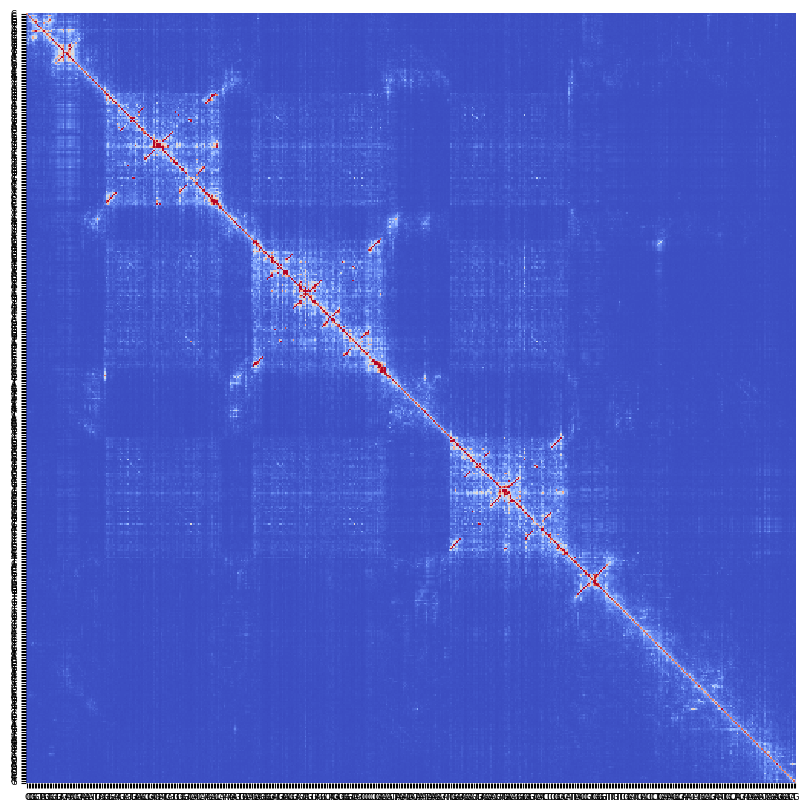

14
b3980
N antidiags: 13
Sequence length: 503


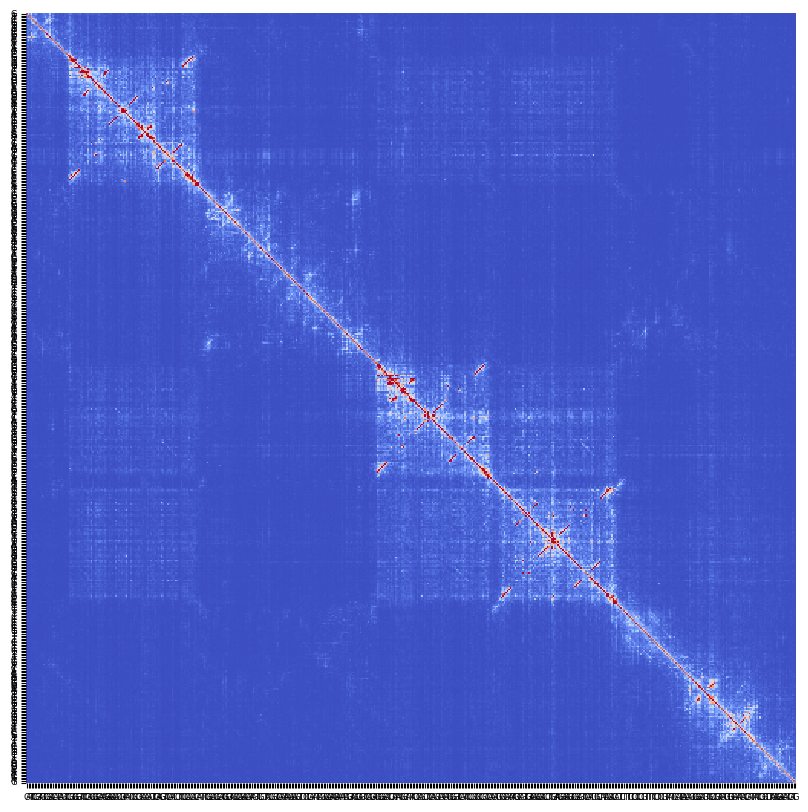

13
b0207
N antidiags: 10
Sequence length: 503


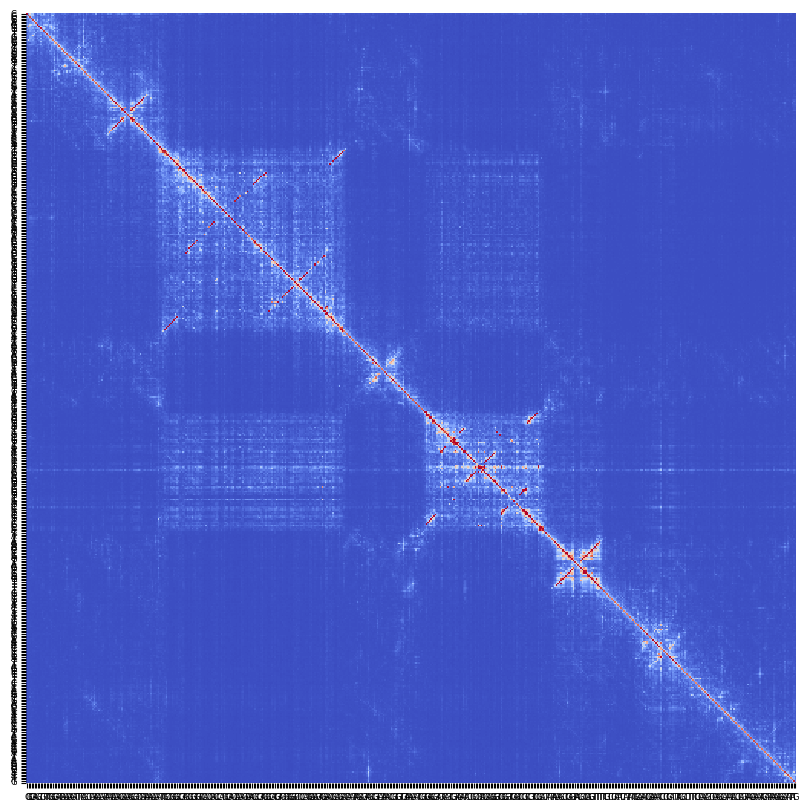

10
b4011
N antidiags: 10
Sequence length: 503


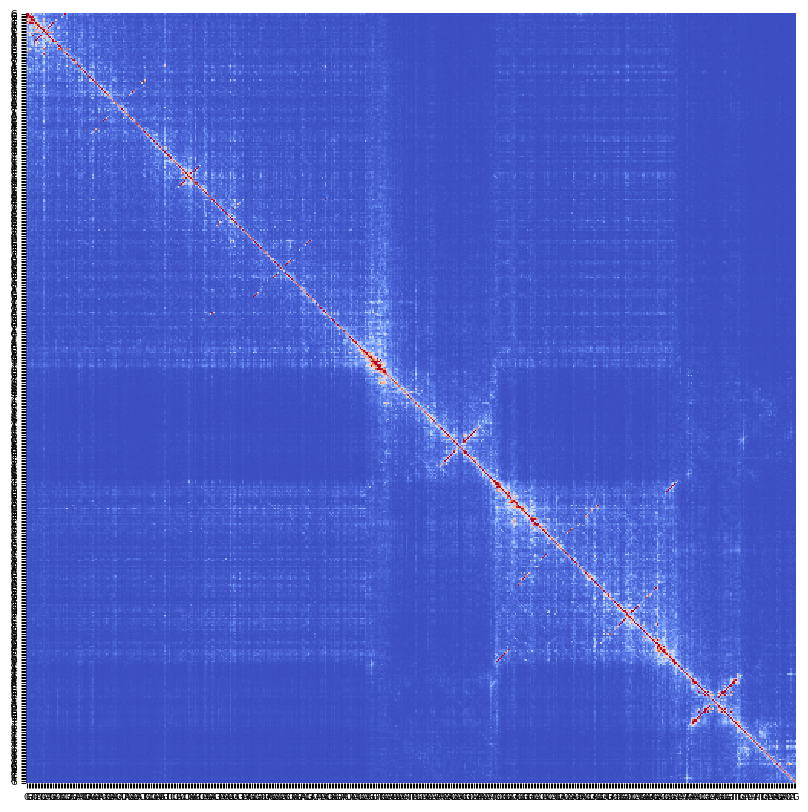

10
b3966
N antidiags: 8
Sequence length: 503


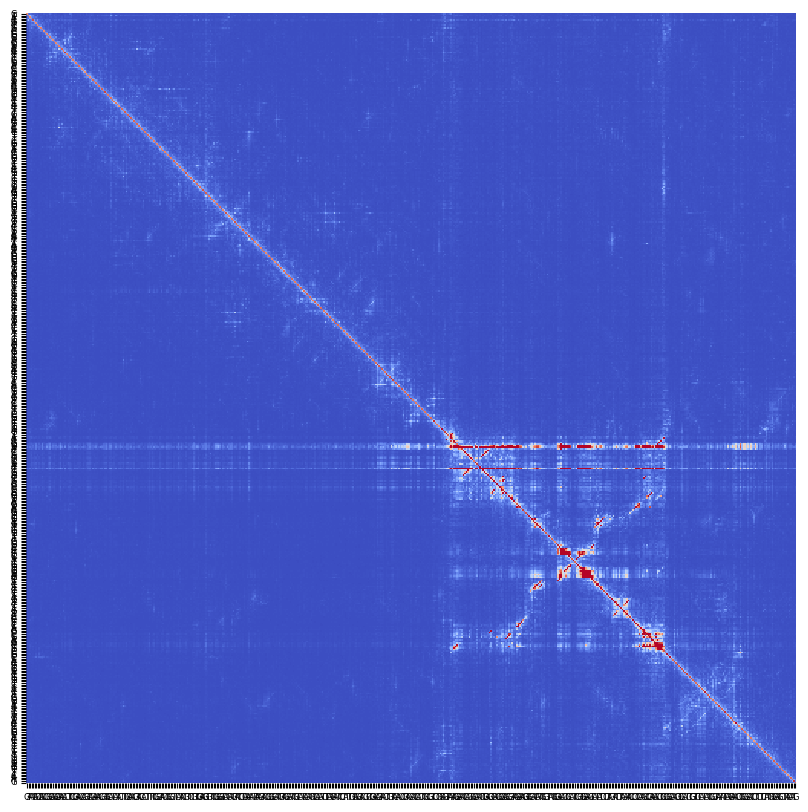

8
b3972
N antidiags: 8
Sequence length: 503


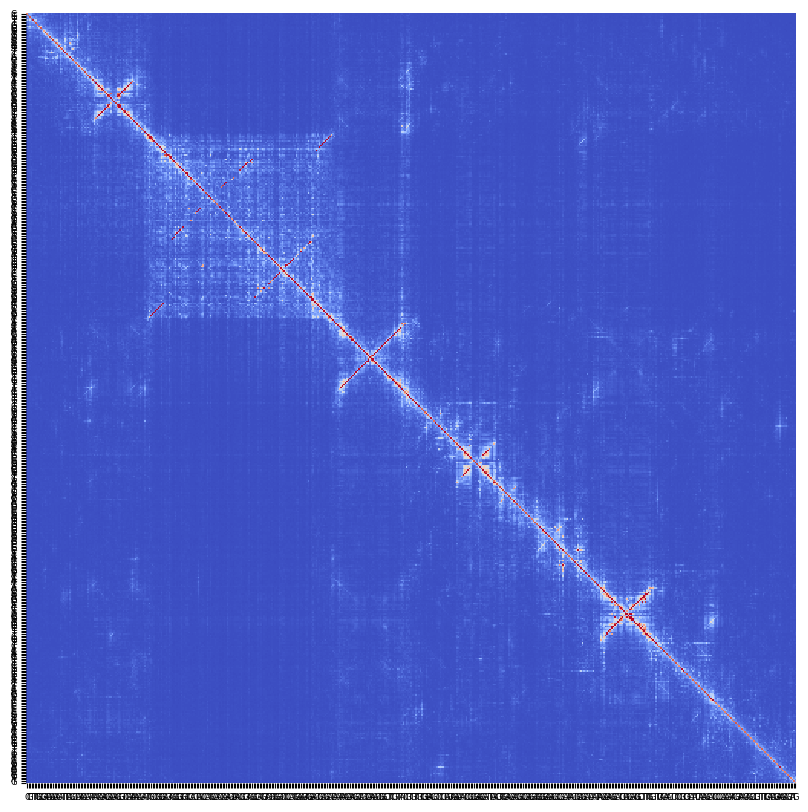

8
b1667
N antidiags: 8
Sequence length: 503


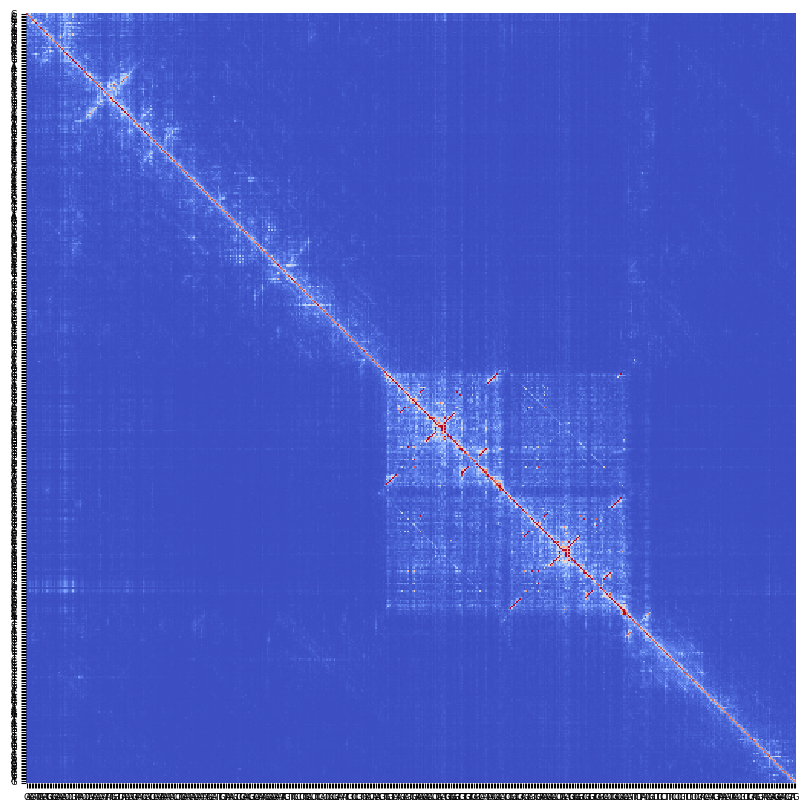

8
b2398
N antidiags: 6
Sequence length: 503


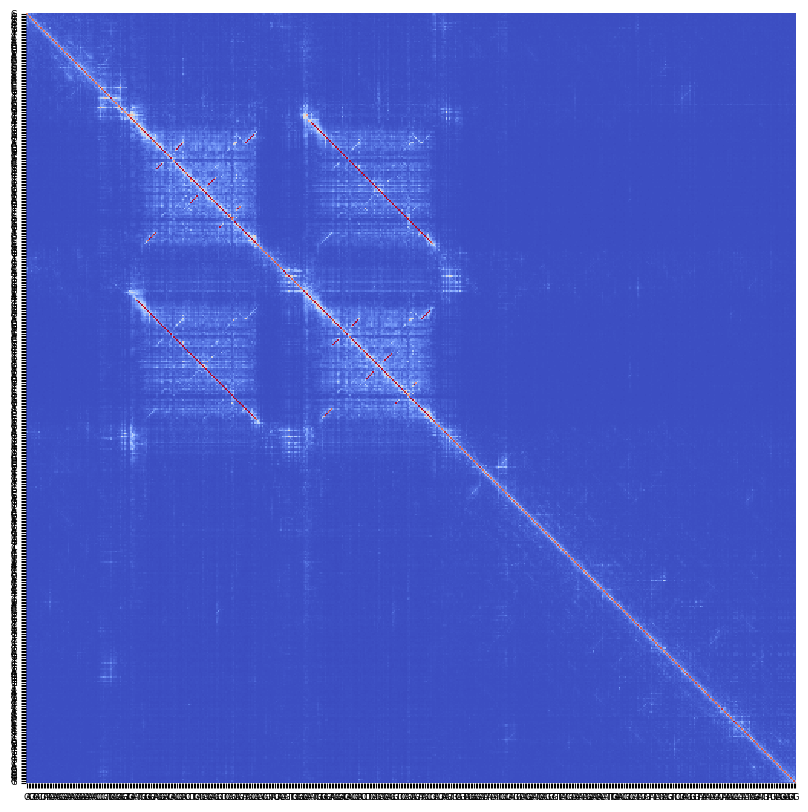

6
b2622
N antidiags: 5
Sequence length: 503


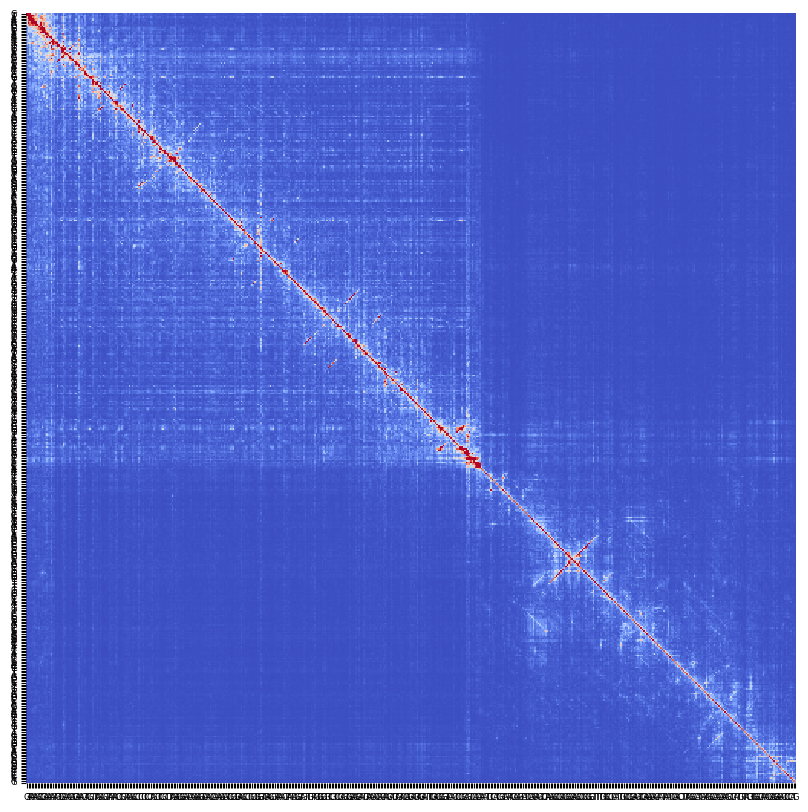

5
b1978
N antidiags: 5
Sequence length: 503


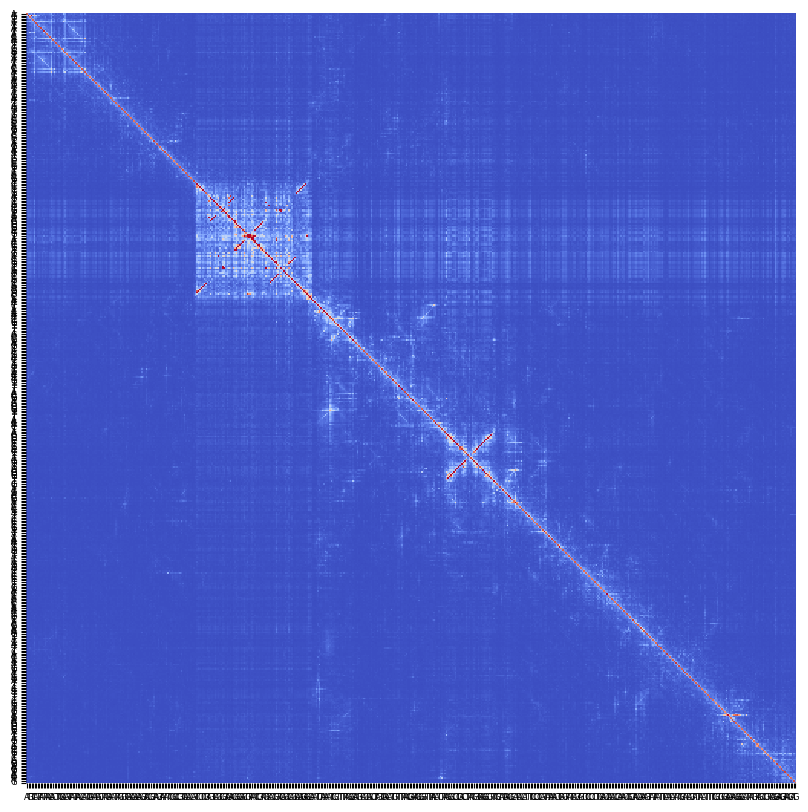

5
b0217
N antidiags: 5
Sequence length: 503


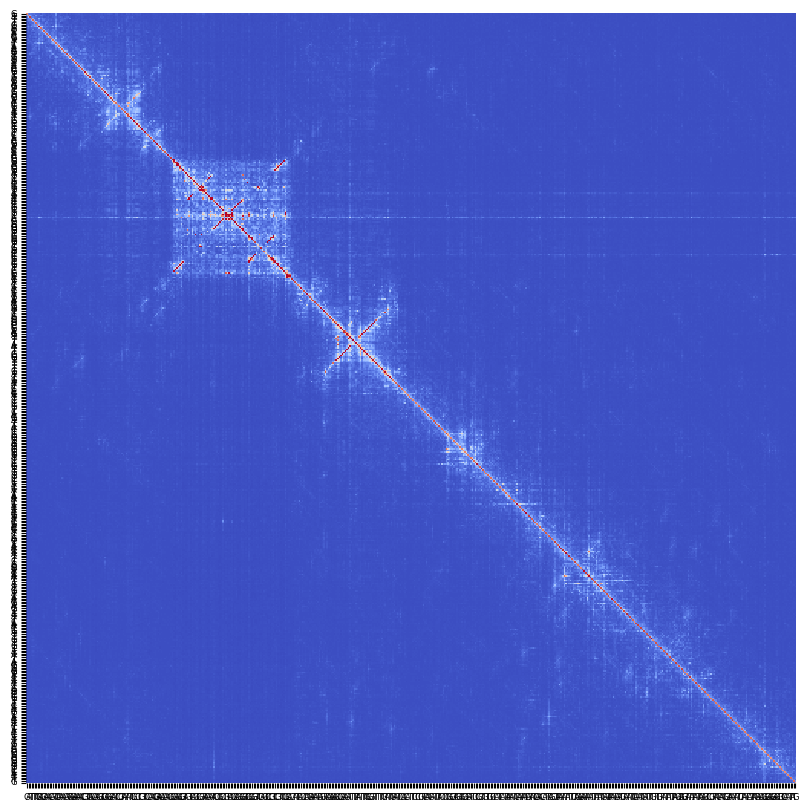

5
b1033
N antidiags: 5
Sequence length: 503


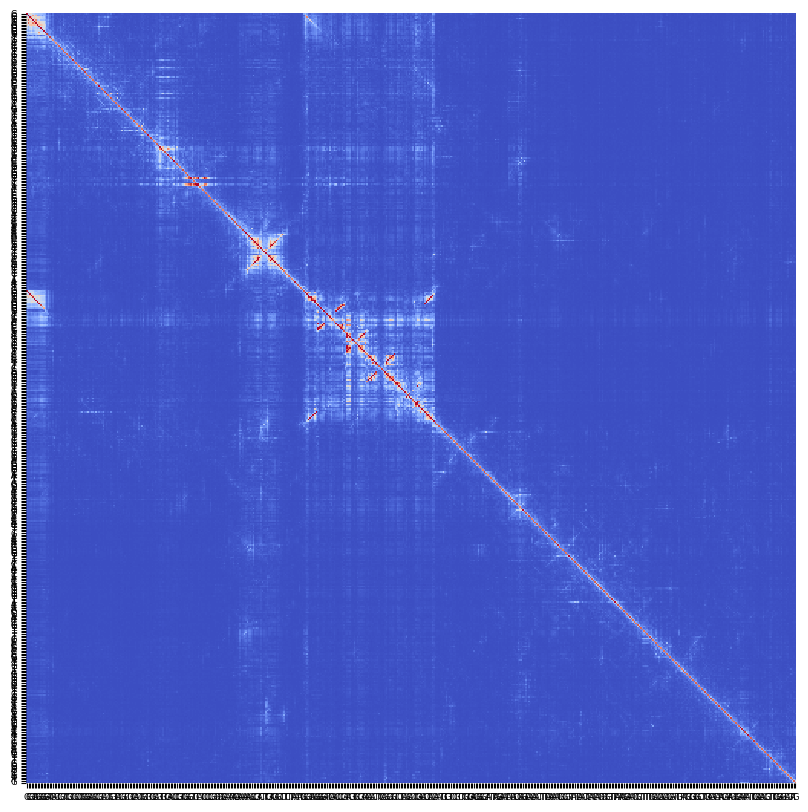

5
b2349
N antidiags: 4
Sequence length: 503


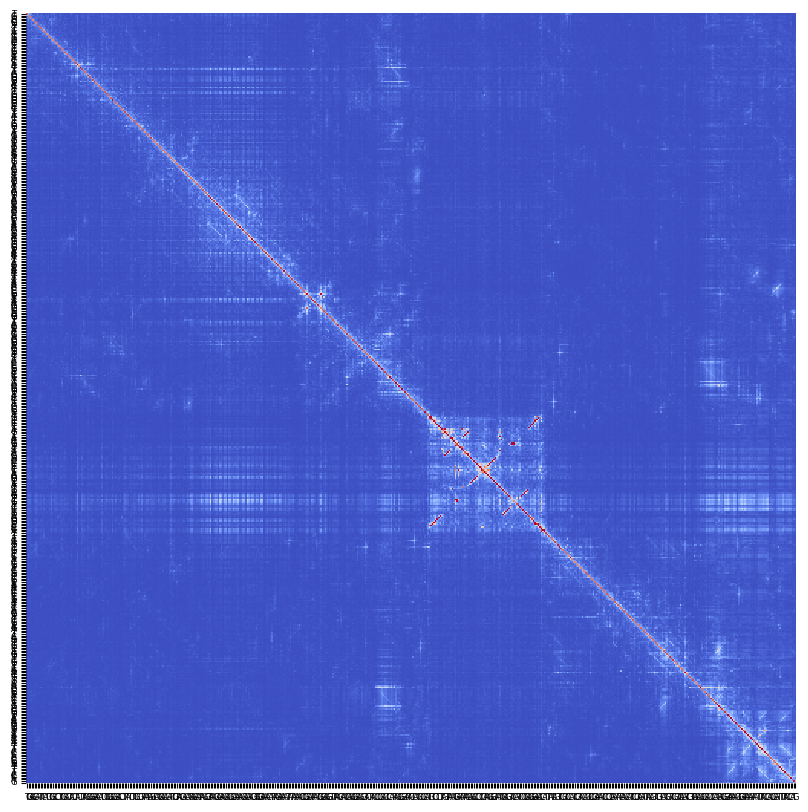

4
b0456
N antidiags: 4
Sequence length: 503


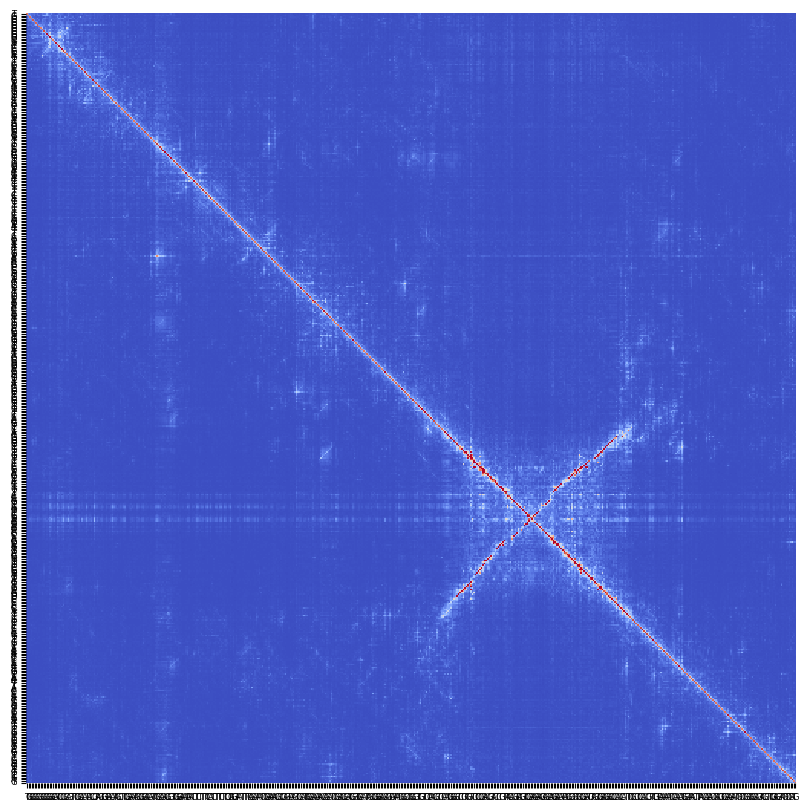

4
b0750
N antidiags: 4
Sequence length: 503


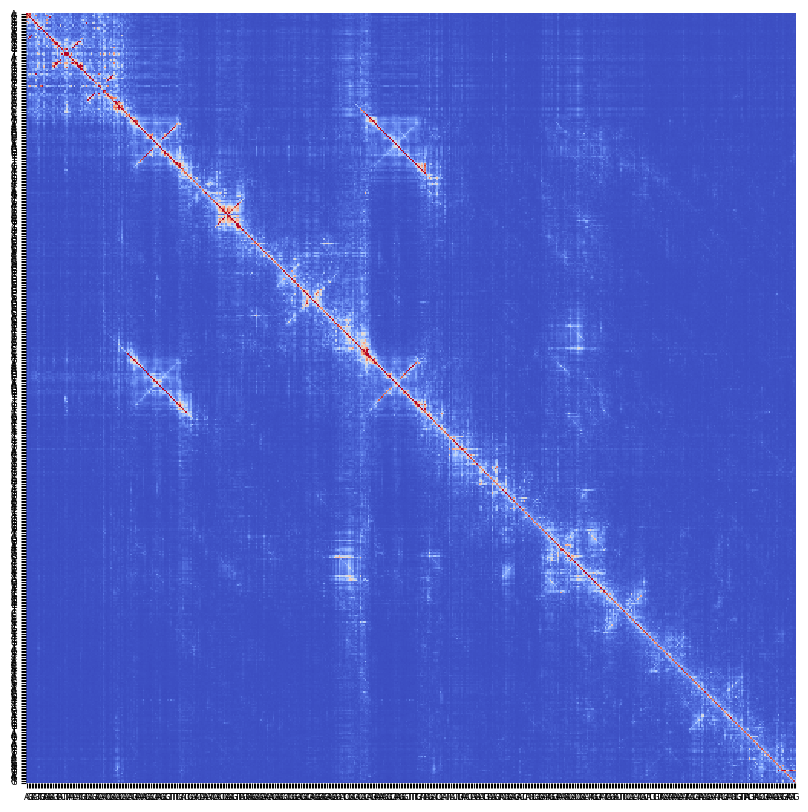

4
b3172
N antidiags: 4
Sequence length: 503


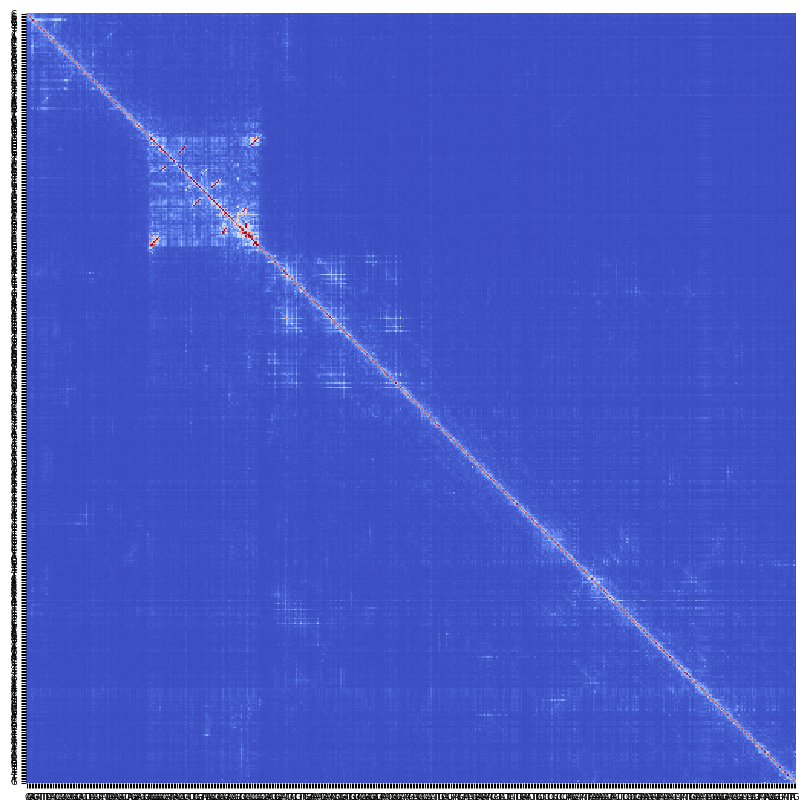

4
b2775
N antidiags: 4
Sequence length: 503


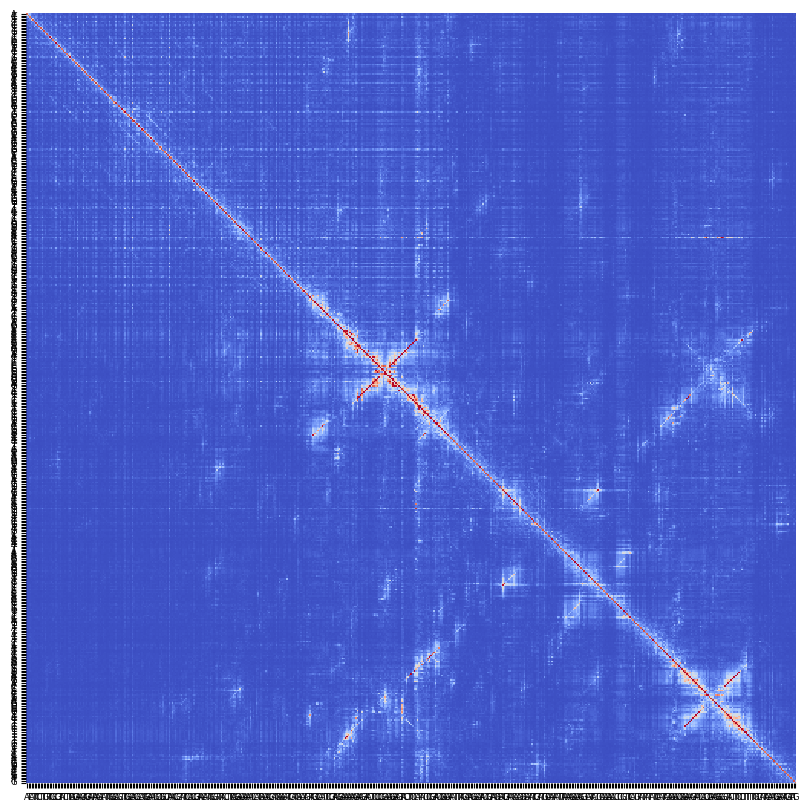

4
b3600
N antidiags: 3
Sequence length: 503


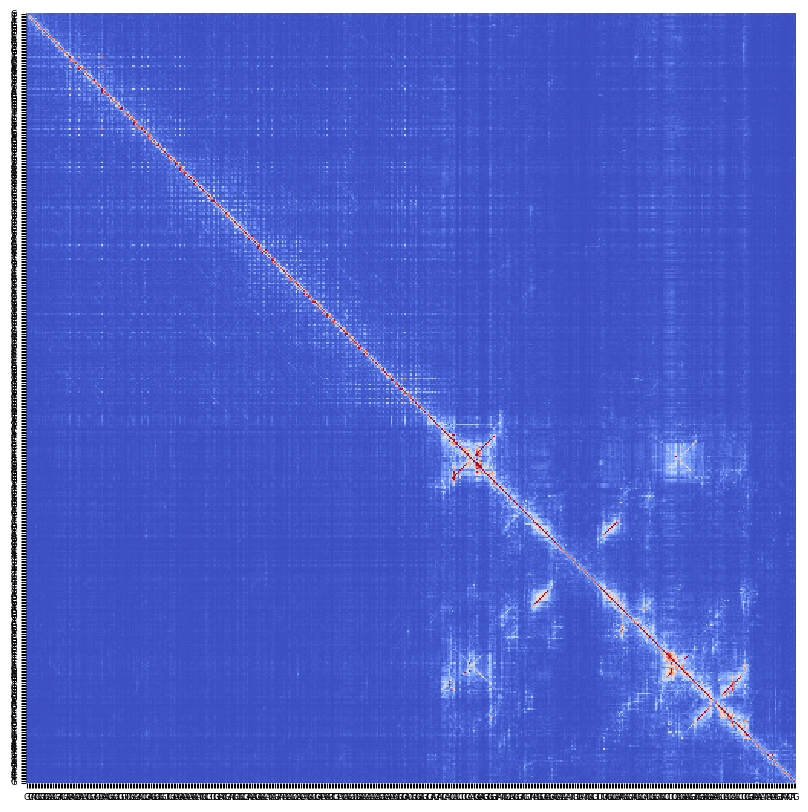

3
b0028
N antidiags: 3
Sequence length: 503


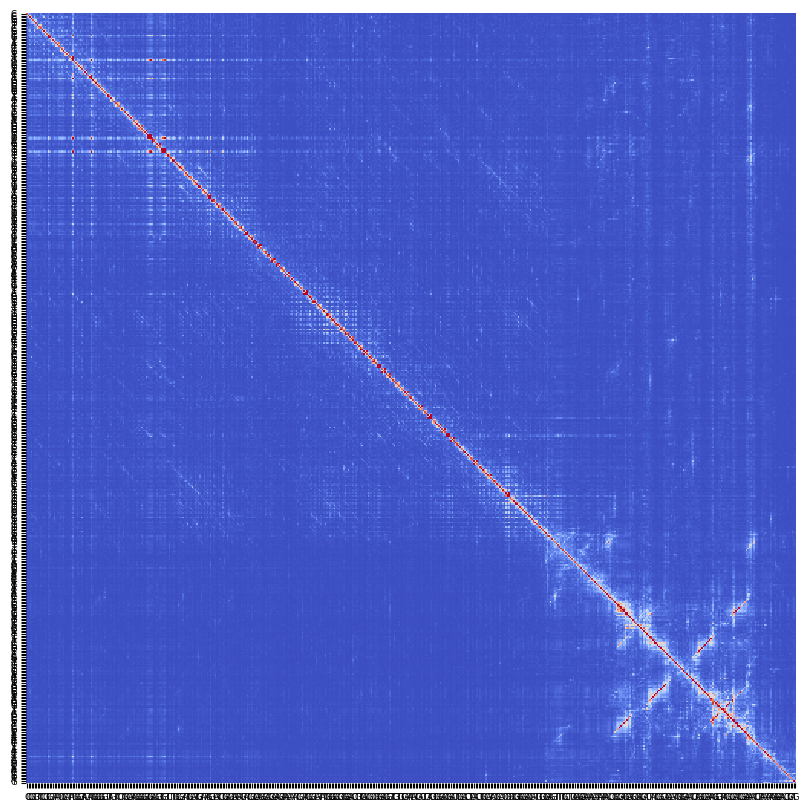

3
b2599
N antidiags: 3
Sequence length: 503


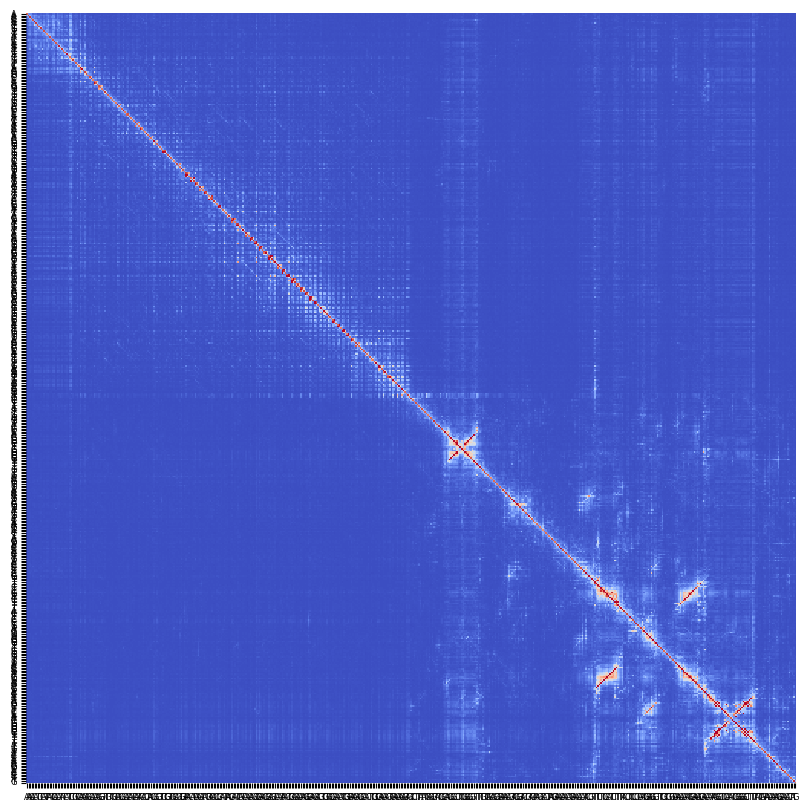

3
b1976
N antidiags: 3
Sequence length: 503


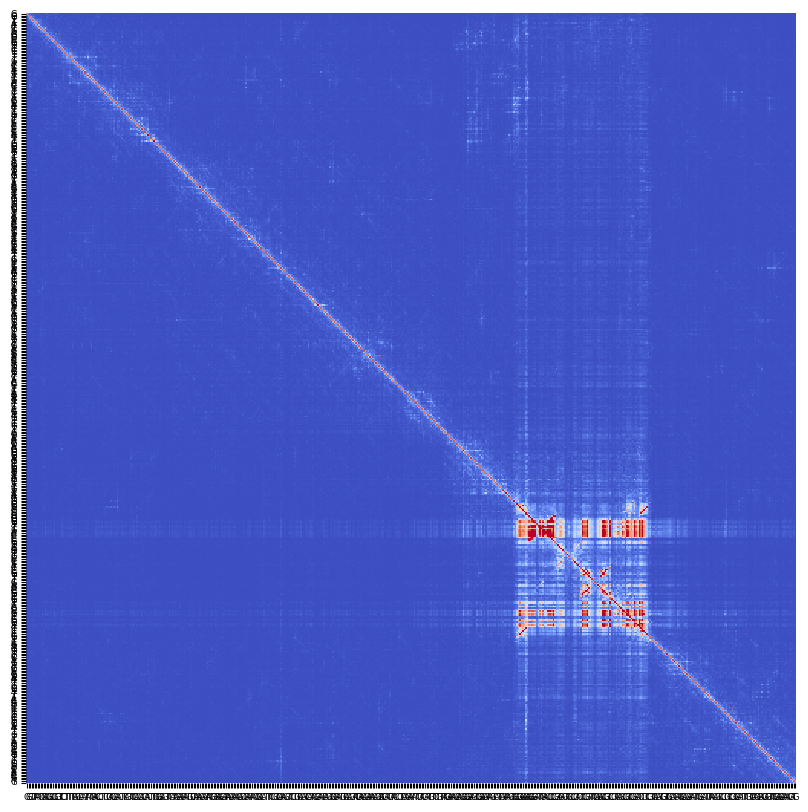

3
b4176
N antidiags: 2
Sequence length: 503


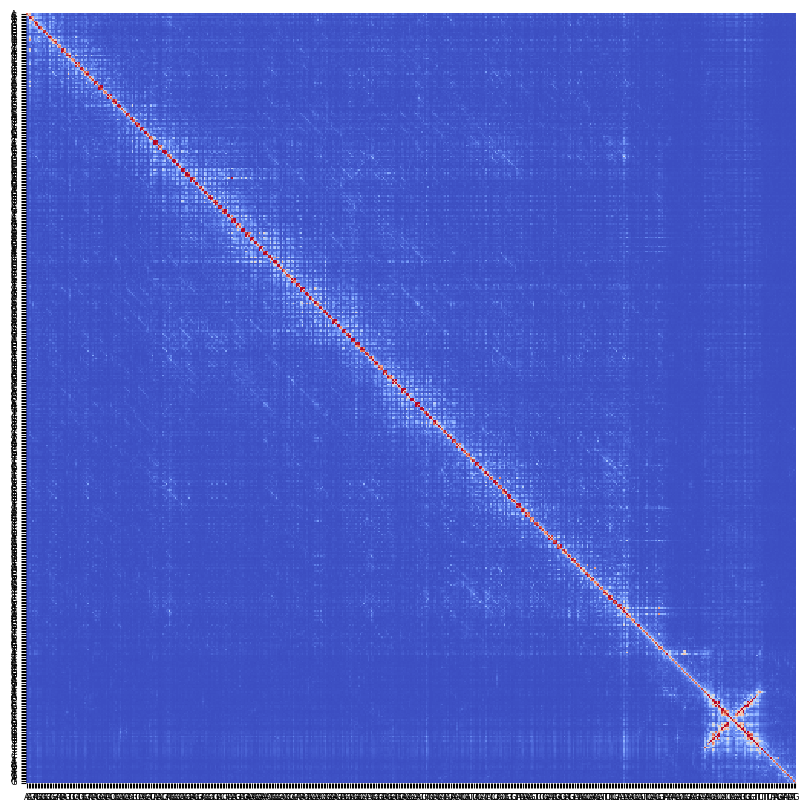

2
b3136
N antidiags: 2
Sequence length: 503


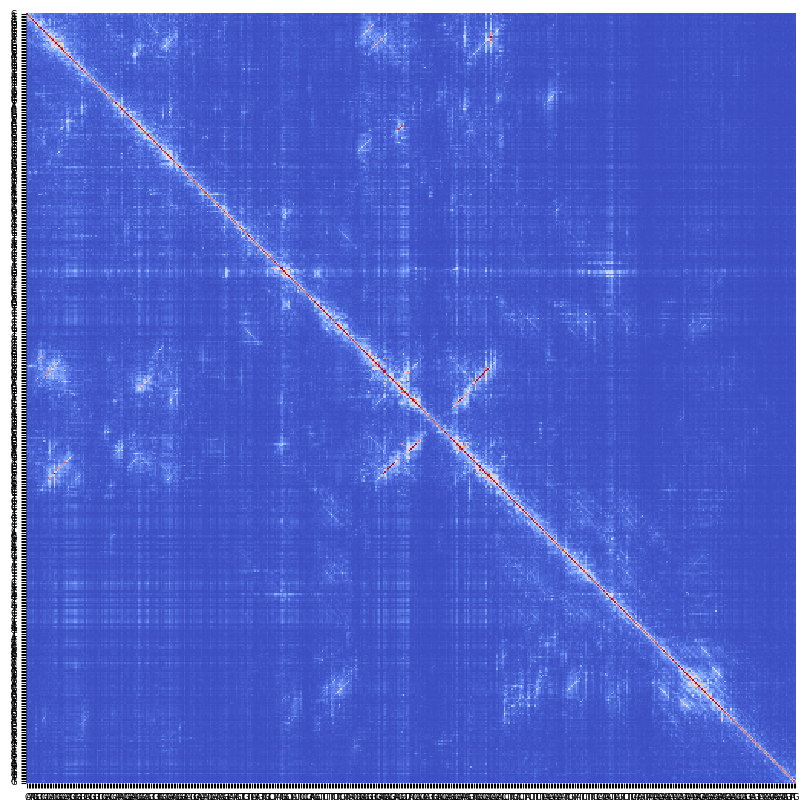

2
b0972
N antidiags: 2
Sequence length: 503


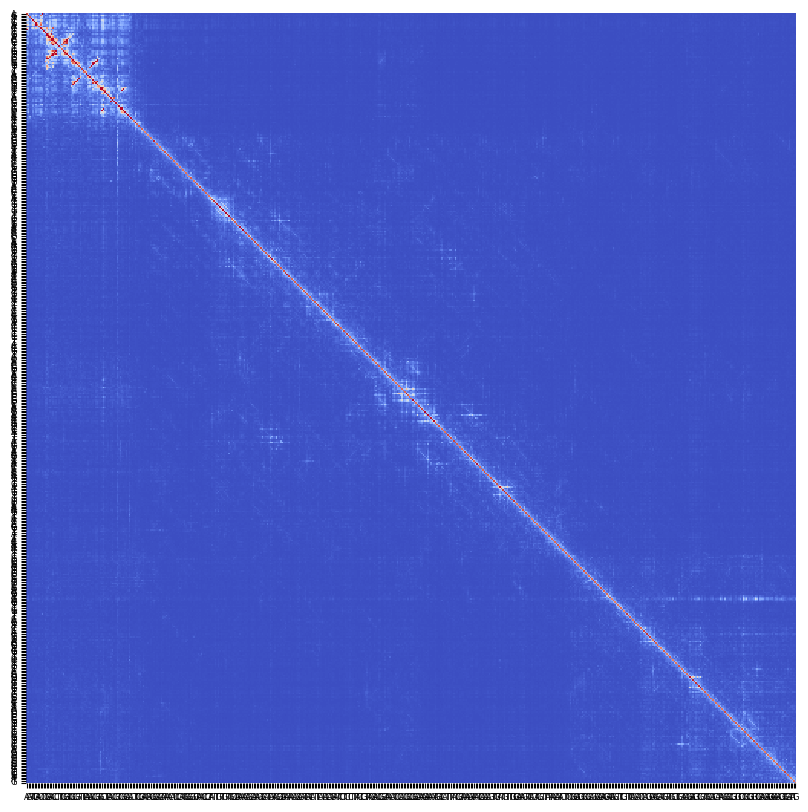

2
b0680
N antidiags: 2
Sequence length: 503


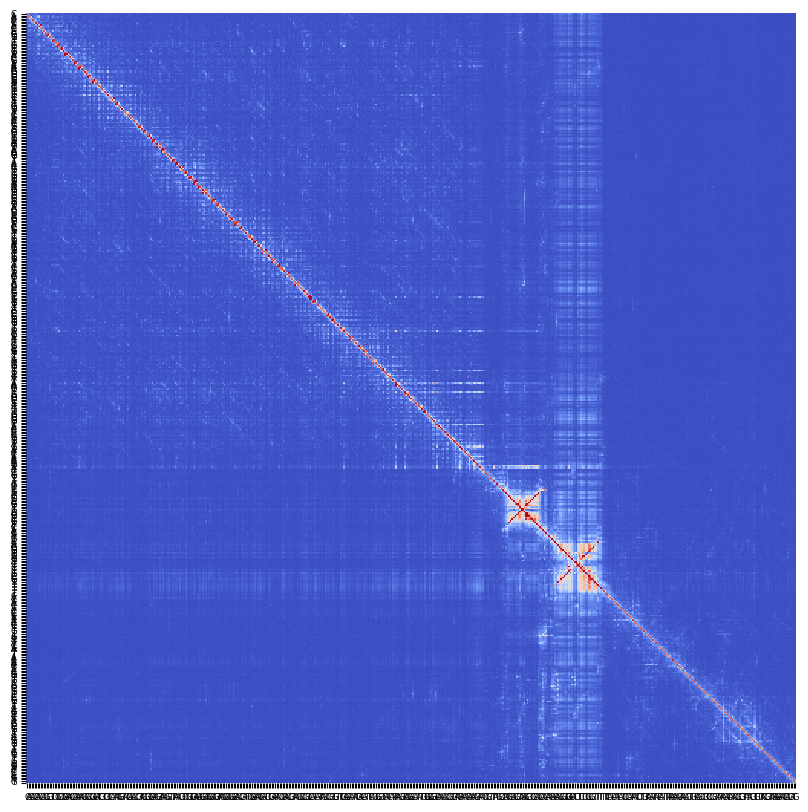

2
b0726
N antidiags: 2
Sequence length: 503


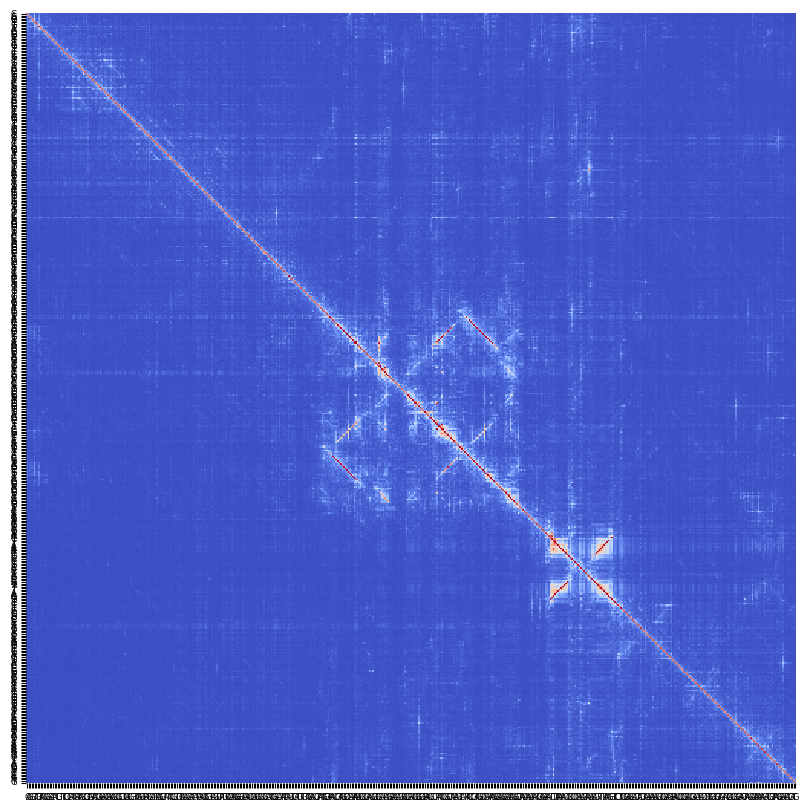

2
b3408
N antidiags: 2
Sequence length: 503


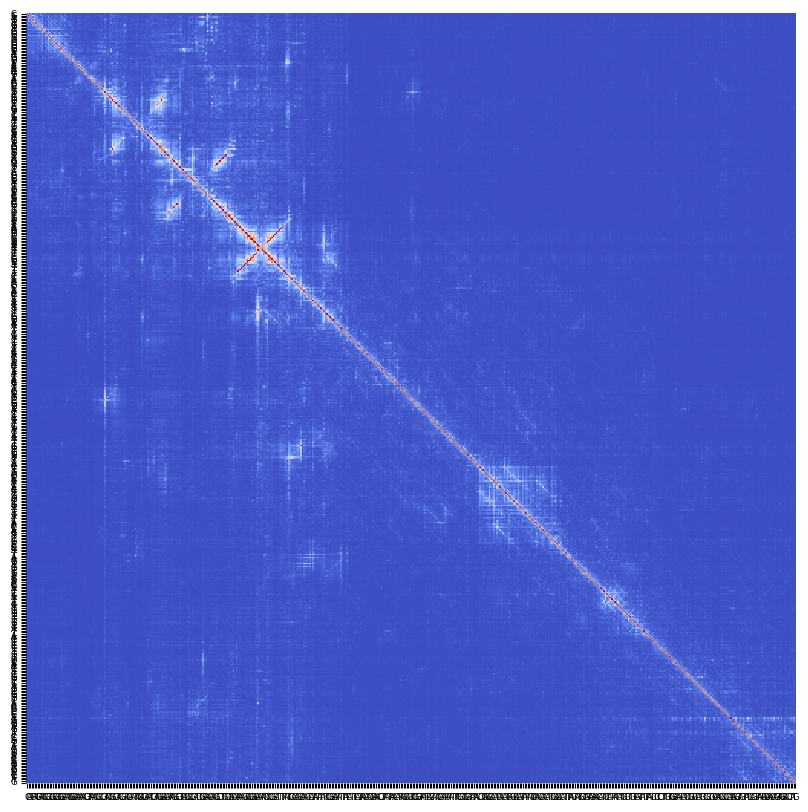

2
b3088
N antidiags: 2
Sequence length: 503


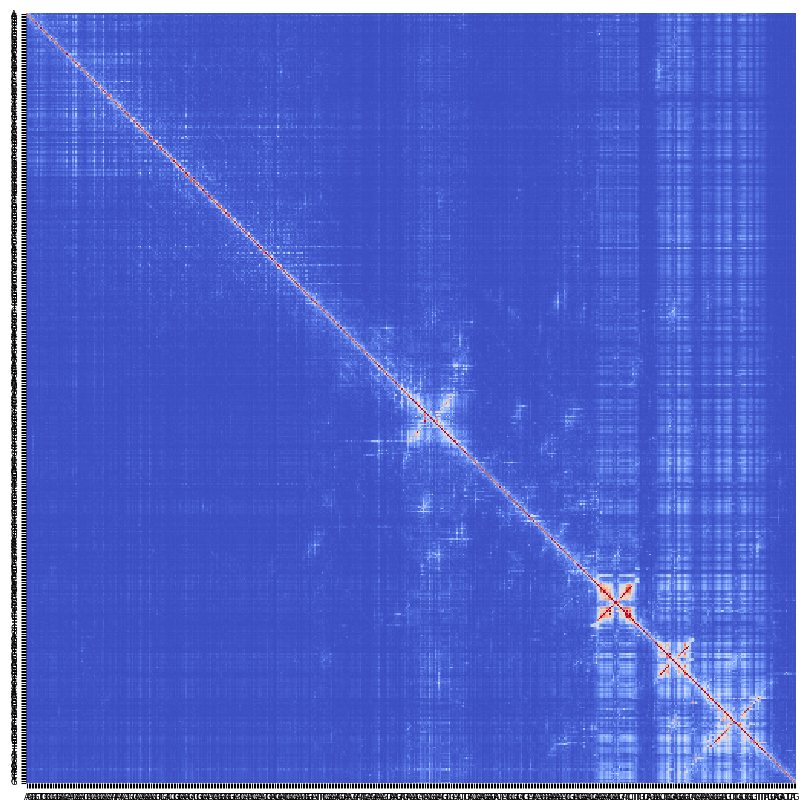

2
b2586
N antidiags: 1
Sequence length: 503


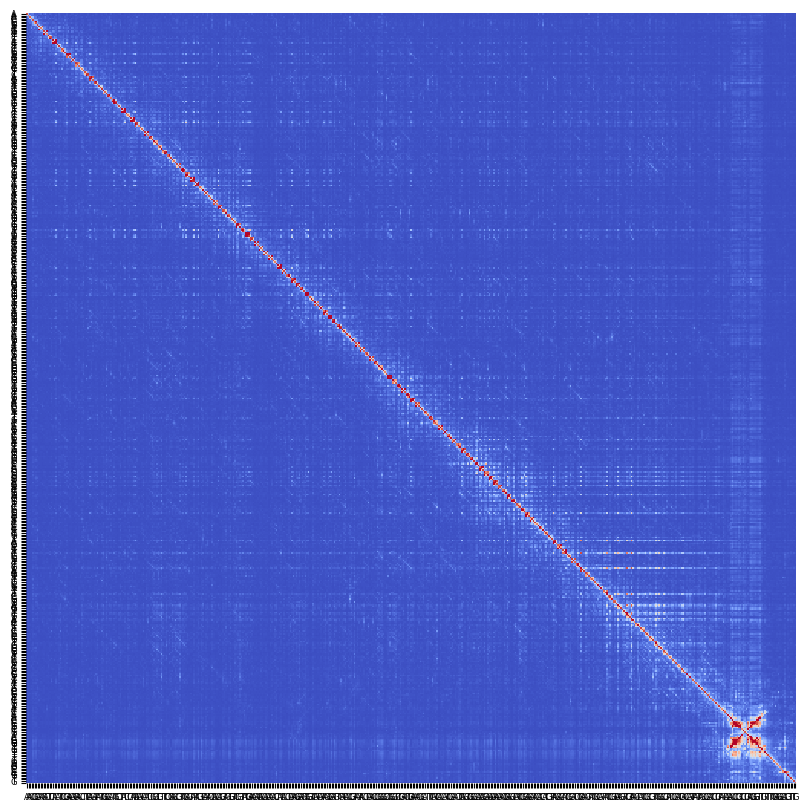

1
b0913
N antidiags: 1
Sequence length: 503


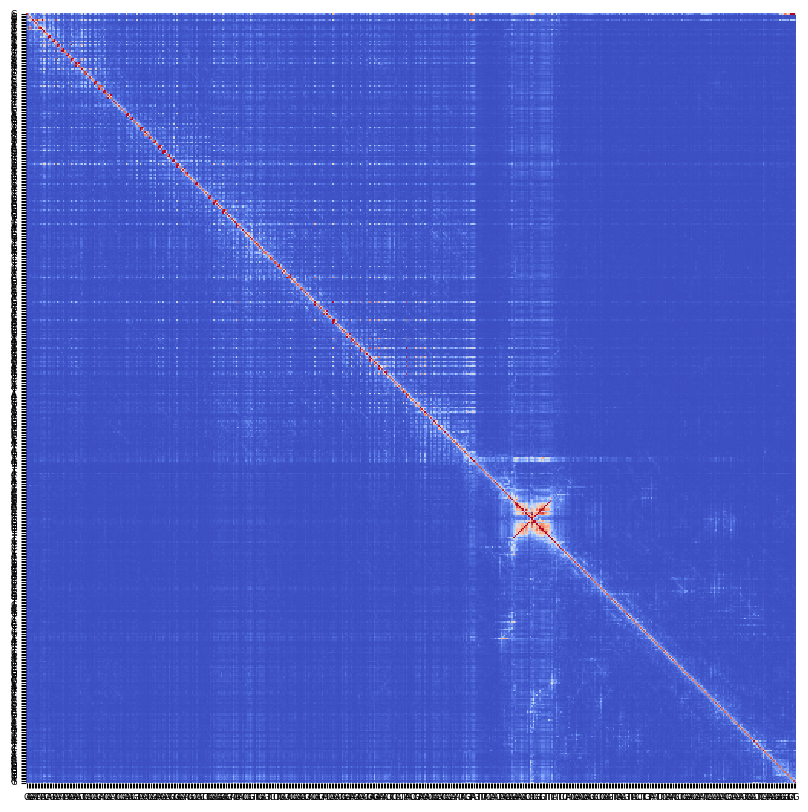

1
b3258
N antidiags: 1
Sequence length: 503


KeyboardInterrupt: 

In [24]:
for i, row in top_hits_df.sort_values('anti_diag', ascending=False).iterrows():
    utr_chunk = row['utr_chunk']
    print(row['transcript_id'])
    print('N antidiags:', row['anti_diag'])
    ci_matrix = np.load(utr_chunk)

    plot_w_seq(ci_matrix, gtf_start_df[gtf_start_df.gene_id==row['transcript_id']].seq.values[0], plot_size=10, tick_label_fontsize=6, filename=None, savefig=False)
    
    print(row['anti_diag'])

In [198]:
gtf_start_df = gtf_df[gtf_df['Feature'] == 'start_codon'].copy()
n_bp = 500
gtf_start_df['Start'] = gtf_df.apply(lambda x: x['Start'] - n_bp if x['Strand'] == '+' else x['Start'], axis=1)

In [199]:
genes_of_interest = ['b0028']

In [202]:
# get sequecne of genes of interest
gtf_start_pr = pr.PyRanges(gtf_start_df)
gtf_start_pr.seq = pr.get_sequence(gtf_start_pr, fasta_file)
gtf_start_df = gtf_start_pr.df

# compute the ci matrix for the genes of interest
ci_matrices = []
for gene_id in genes_of_interest:
    gene_seq = gtf_start_df[gtf_start_df.gene_id == gene_id].seq.values[0]
    ci_matrix = compute_ci_matrix(gene_seq)
    ci_matrices.append(ci_matrix)

Inferencing 26 batches
Inferencing done
(1642, 503, 4)
shape of the reference probs: (503, 4)


Sequence length: 503


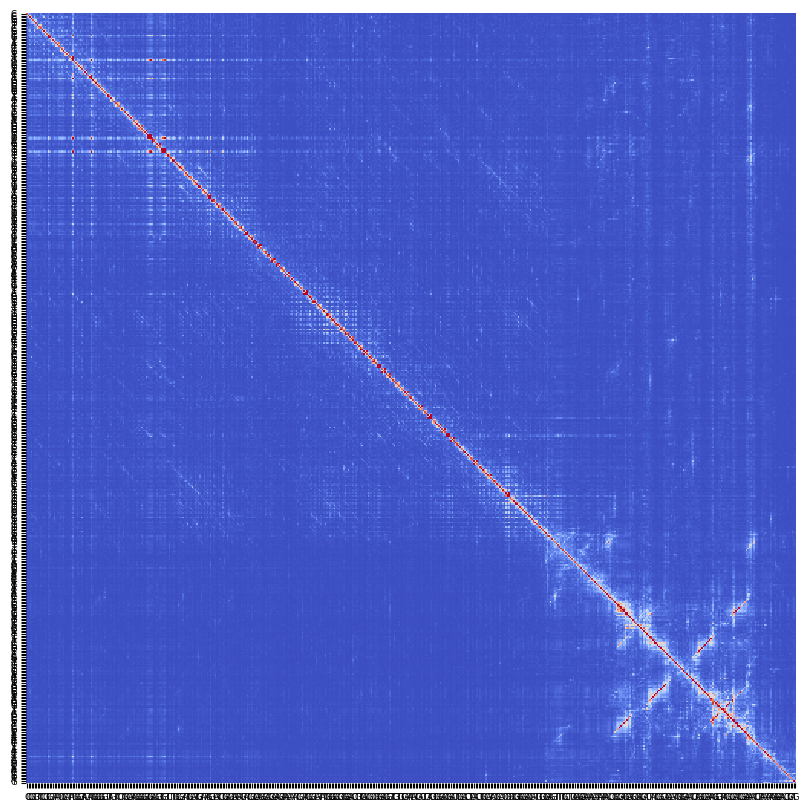

In [203]:
plot_w_seq(ci_matrices[0], gtf_start_df[gtf_start_df.gene_id == genes_of_interest[0]].seq.values[0], plot_size=10, tick_label_fontsize=6, filename=None, savefig=False)

Sequence length: 203


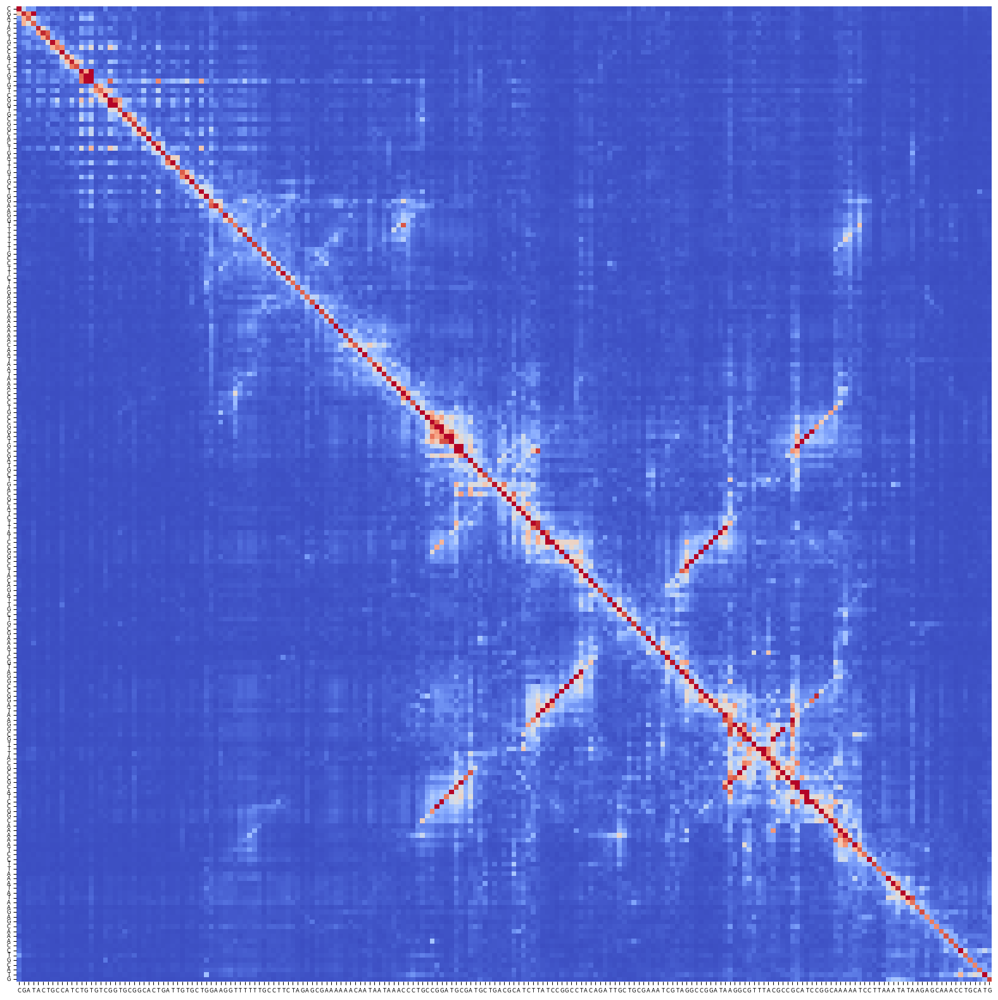

In [207]:
plot_w_seq(ci_matrices[0][300:, 300:], gtf_start_df[gtf_start_df.gene_id == genes_of_interest[0]].seq.values[0][300:], plot_size=20, tick_label_fontsize=6, filename=None, savefig=False)